In [1]:
#Importing all the required libraries
import xarray 
import os
import netCDF4
import numpy as np
import matplotlib.pyplot as plt
import imdlib as imd

In [2]:
#Accessing nc the datasets
path=[]


#Storing the paths in a array
for i in range(1901,2023):
    path.append(fr"C:\Users\ratho\Desktop\Software Group Project - III\Climate Data Modelling\Data\IMD Data\RF25_ind{i}_rfp25.nc")

    
#Accessing all the datasets and storing all data in all_data list
all_data=[]
for i in path:
    temp = xarray.open_dataset(i)
    all_data.append(temp)


all_data[0]

<xarray.Dataset>
Dimensions:  (time: 365, lat: 129, lon: 135)
Coordinates:
  * lat      (lat) float64 6.5 6.75 7.0 7.25 7.5 ... 37.5 37.75 38.0 38.25 38.5
  * lon      (lon) float64 66.5 66.75 67.0 67.25 67.5 ... 99.25 99.5 99.75 100.0
  * time     (time) datetime64[ns] 1901-01-01 1901-01-02 ... 1901-12-31
Data variables:
    rain     (time, lat, lon) float64 ...
Attributes:
    Conventions:  CF-1.7
    title:        IMD gridded data
    source:       https://imdpune.gov.in/
    history:      2023-08-11 16:43:06.157151 Python
    references:   
    comment:      
    crs:          epsg:4326

In [3]:
all_data[1]['rain'][1]

<xarray.DataArray 'rain' (lat: 129, lon: 135)>
[17415 values with dtype=float64]
Coordinates:
  * lat      (lat) float64 6.5 6.75 7.0 7.25 7.5 ... 37.5 37.75 38.0 38.25 38.5
  * lon      (lon) float64 66.5 66.75 67.0 67.25 67.5 ... 99.25 99.5 99.75 100.0
    time     datetime64[ns] 1902-01-02
Attributes:
    units:      mm/day
    long_name:  Rainfall

In [4]:
def selectJuneToSeptember(data,year):
    start_date = f'{year}-06-01'
    end_date = f'{year}-09-30'
    return data.sel(time=slice(start_date, end_date))
    

In [5]:
#Only extracting the data in between the months june to september

year = 1901
for i in range(len(all_data)):
    all_data[i] = selectJuneToSeptember(all_data[i],year)
    
    #Removing the nan values
    #all_data[i] = all_data[i].where(all_data[i]['rain'] != -999.)
    year += 1

In [6]:
def PlotMap(data,year=None):
    # Create a figure and axis for the plot
    fig, ax = plt.subplots()

    # Create a colormap
    cmap = plt.get_cmap('jet')  # You can choose any other colormap you prefer

    # Determine the appropriate color limits based on your data
    vmin = 0.0  # Minimum value for the color scale
    vmax = 10.0  # Maximum value for the color scale

    # Plot the average yearly rainfall data using the colormap
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax, origin='lower',
                   extent=[data['lon'].min(), data['lon'].max(),
                           data['lat'].min(), data['lat'].max()])

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, label='Rainfall')

    # Set axis labels
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'Average Yearly Rainfall Data of {year} from June to September')

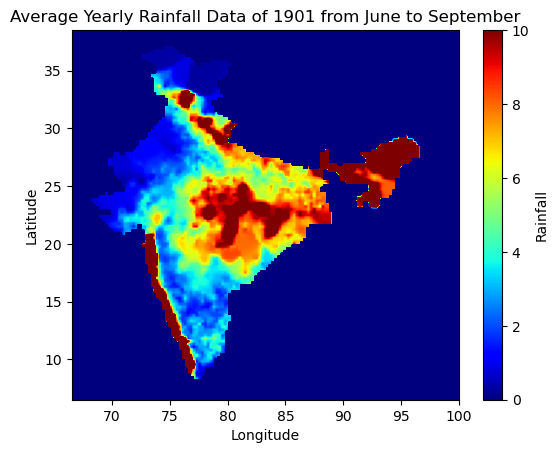

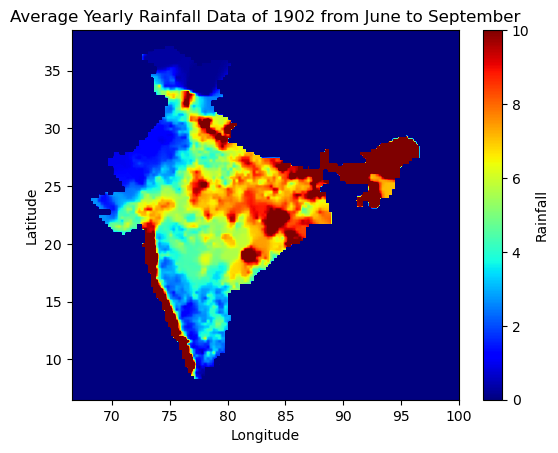

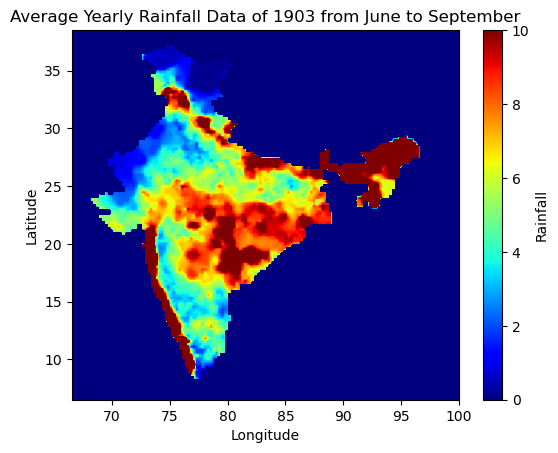

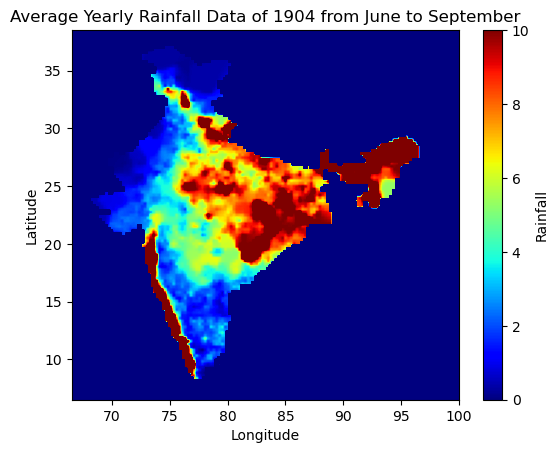

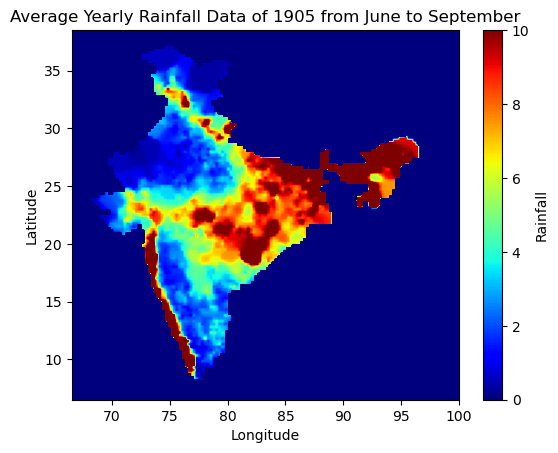

...

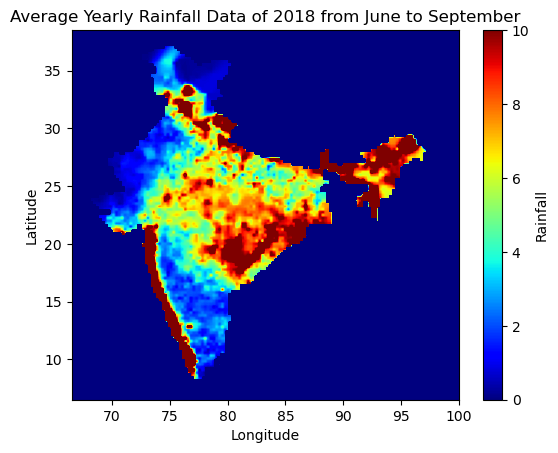

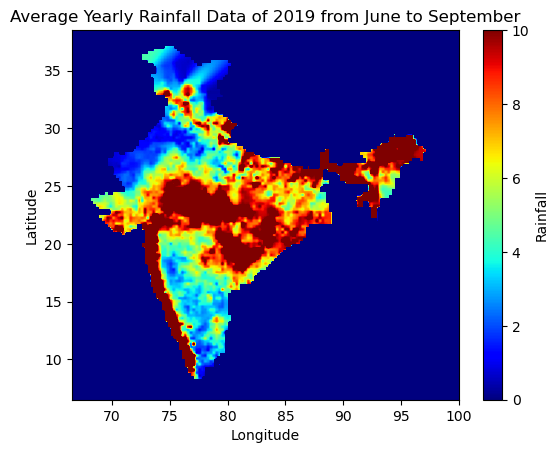

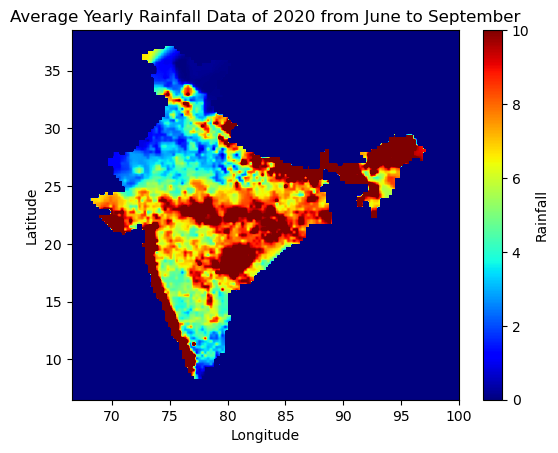

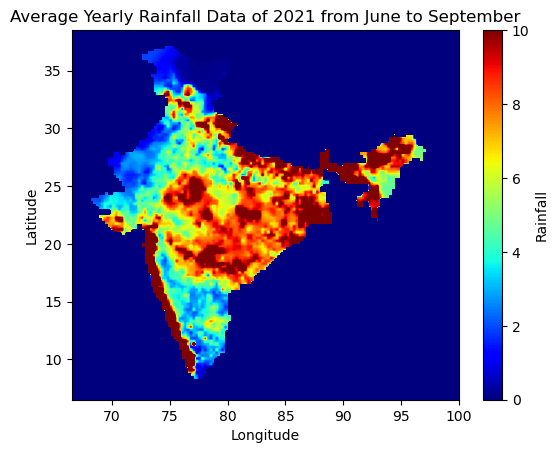

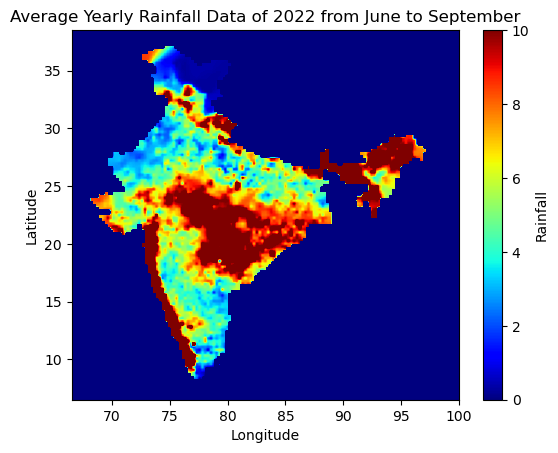

In [7]:
#Plotting the mean of every year from 1901 to 2022
yr=1901
all_data_mean=[]
inst=0
for i in range(len(all_data)):
    
    # Calculate the mean rainfall over the entire year
    all_data_mean.append(all_data[i]['rain'].mean(dim='time'))
    
    PlotMap(all_data_mean[inst],yr)
    yr+=1
    inst+=1
    # Show the plot
    plt.show()

In [8]:
np.set_printoptions(threshold=np.inf, linewidth=np.inf)
print(np.array(all_data_mean[0]))
#all_data_mean[0].shape

[[-9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.99000000e+02 -9.990

In [9]:
import pandas as pd
from sklearn.cluster import KMeans

#Creating a k means object with 9 clusters
km = KMeans(n_clusters=9, n_init='auto',max_iter=1000,random_state=0)
km

KMeans(max_iter=1000, n_clusters=9, n_init='auto', random_state=0)

In [10]:
rainfall_flattened=[] 

#Flattening the rainfall mean data to fit into the kmeans object
for i in all_data_mean:
    rainfall_flattened.append(i.stack(lat_lon=('lat', 'lon')))

print(np.array(rainfall_flattened).shape)

(122, 17415)


In [11]:
#Spilting the mean of every years into the clusters
rainfall_clusters = km.fit_predict(rainfall_flattened)

C:\Users\ratho\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [12]:
km.inertia_

2979241.1123809027

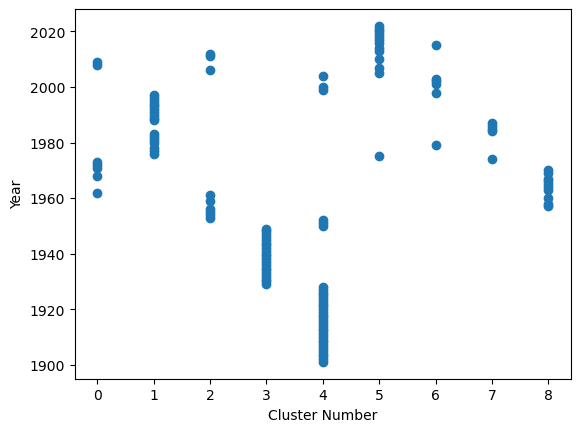

In [13]:
rainfall_clusters
cluster_graph={'Year': [i for i in range(1901,2023)],
              'Cluster' : rainfall_clusters}
cluster_df=pd.DataFrame(cluster_graph)
#cluster_df
plt.xlabel("Cluster Number")
plt.ylabel("Year")
plt.scatter(cluster_df.Cluster,cluster_df.Year)

C:\Users\ratho\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ratho\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ratho\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ratho\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Window

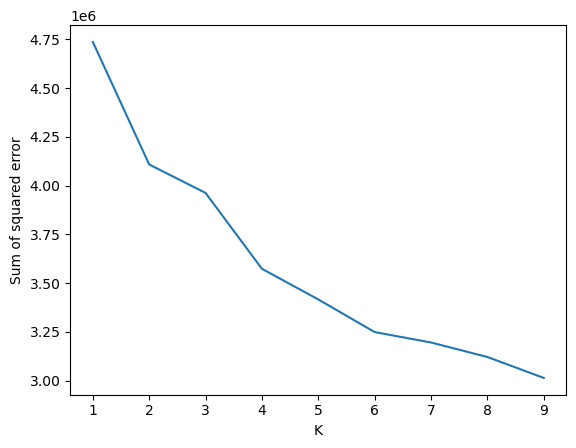

In [14]:
#Finding suitable clusters with elbow technique
k_rng=range(1,10)
sse=[]
for k in k_rng:
    km = KMeans(n_clusters=k,n_init='auto')
    km.fit(rainfall_flattened)
    #Getting sse
    sse.append(km.inertia_)

plt.xlabel('K')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)